In [1]:
#basic importing
import os
import sys
path1=sys.path.append('/u/vasulkar/p_emodnet_amey/Regional_canada_model/')
from IPython.display import Image
from IPython.core.display import HTML 
# Image("sea_ice_division.jpg")

# Introduction
The sea ice cover is divided in three parts.

<!-- ![title](sea_ice_division.jpg) -->
<img src="sea_ice_division.jpg" width="900"/>


Assuming the drifting sea ice and water as one integrated layer. The momentum equatio for the integrated layer is given by:
$$\frac{\partial u}{\partial t}+f\times u +\frac{(u. \partial)u}{h}=-g\nabla(\zeta)+\nabla.(\tilde{\nu}(\nabla u + \nabla u^T))+\frac{\rho_w \tilde{C_w}u|u|}{h}+\frac{\tau_{IT}}{h}, $$
where $\tilde{\nu}$ is the effective viscosity of the ice-ocean layer and $\tilde{C_w}=C_w+C_i$ with $C_w$ being the bottom friction coefficient and $C_i$ is the drag coefficient between fast ice and ocean. 
 
The idea is to optimize the effective viscosity parameter in the region of the sea ice cover. Now, we can only have a certain number of parameters so the region of sea ice cover has to be discretized and each point in the discretized domain acts as a parameter. But this is not possible realistically as we will have a lot of parameters than observations. So, the idea here is to analyse the domain and use physics to determine how the sea ice cover can be divided. The division of the sea ice cover will give us the number of parameters and their distribution. For this, we use the energy loss from the viscous shear as a parameter to judge in the domain where the energy loss to viscous shear is high and important. 


# Smagorinsky Model
For this, in dflowfm there is not direct way to compute the viscous shear. So we impose aa smagorinsky turbulence model in the computations.
The model states that the residual viscous shear to close the N-S equations is given by:
$$\tau^r=-2\nu_r \bar{S},$$
where $\nu_r$ is the residual effective viscosity and $\bar{S}$ is the Strain Rate. Now in DFlow-FM the effective viscosity map is available and it is computed as:
$$\nu_r=\nu_i+((C_sdx)^2)\bar{S},$$
where $\nu_i(=25)$ is the initial viscosity used in our model, $C_s$ is the Smagorinsky coefficient, $dx$ is the grid step. 

Now, the viscous shear stress is given by:
$$\tau_v=2\nu \partial S. $$
Then, assumeing $C_s=1$, we can use the viscosity output ($\nu_r$) from the model to compute the partial derivative of shear strain as:
$$\bar{S}dx^2=\nu_r-\nu$$

Based on the above analysis, it seems difficult to use the idea. but just plotting the residual viscosity can give some idea for creating boxes. Also, for now in september there is already
less sea ice and that sea ice is located way towards the north. so we can get away with the small square boxes we had before as we might barely have 5-6 boxes.

The next step is to get points from the fibonacci grid in the sea ice cover for 2020 september. Then we create a viscosity value for those points in .xyz format. then we create parameter blocks in the region to multiply on top of that viscosity value/ 

# NOTE

The below analysis ran into failure as the viscosity values were too high. We do another approach which is found in the jupyter notebook:
New-Ice-Parameterization (which will be renamed in future)

In [2]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point, MultiPolygon, shape
import shapefile

import cartopy.crs as ccrs
import cartopy.feature as cpf 
from global_land_mask import globe
import pandas as pd
import os
import pyproj
from osgeo import ogr
from osgeo import gdal
import fiona
from shapely.geometry import shape,mapping, Point, Polygon, MultiPolygon
gdal.UseExceptions()
from pyproj import Proj, transform
from cartopy.feature import ShapelyFeature
import cmocean

First Step is to get the fibonacci points in our model domain. But the issue was that due to coarse resolution in parameter creation there is a chance that the traiangulation might not consider all points in the ice polygon. Also, now (since 20.4.2022) I realised all the points in model domain are actually required and not just 'in polygon' points.  So first step is we create a dense point distribution and compute the viscosity and give fast ice friction values for these points. Then we go to parameter creation with coarser points from the modelpoints_fb.xyz file. 

In [3]:
def Fibonacci_grid(P):
    '''
    Construct Fibonacci grid, see Swinbank & Purser, Fibonacci grids: A novel approach to
    global modelling. Q.J.R. Meteorol. Soc. (2006), 132 : 1769-1793, doi:10.1256/qj.05.227
    Input: 
    P = (preliminary) number of Fibonacci grid points; 
    The Fibonacci grid parameter is then computed as N = (P-1)/2 if P is odd.
    If P is even, we use the equation N = P/2.     
    The final number of Fibonacci points is equal to 2N+1
    Output:
     -lon = longitude [degrees] in interval [-180;180] (spherical coordinates)
     -lat = latitude [degrees] (spherical coordinates)
    '''  
    # Settings
    # N=int(7000)
    # Golden Ration
    Phi=(1+np.sqrt(5))/2
    #fibonacci grid parameter
    N = (P - np.remainder(P,2))/2
    #Compute lat and lon
    Nvec=np.arange(-N,N+1,1)
    Nvc=Nvec.reshape((len(Nvec),1))
    lat = np.arcsin((2*Nvec)/(2*N+1))*(180/np.pi)
    #lon from -180 to 180 and 0 to 360 is different
    lon = np.remainder(360*Nvec/Phi,360)   #this provides longitudes over [0,360]
    lon=lonunwrap(lon)
    return(lon,lat)

def lonunwrap(lon360):
    lon180=(lon360+180.0) %360.0 -180
    return(lon180)

In fibonacci grid is the idea is that it is equal area. and a N=1000 --> 500km grid length. i.e. resoluton. Also, goes up by a factor of two. So for 250km grid length we will have N=4000. 

In [4]:
#for 10km resolution based on sea ice dataset. 
# an extra 2 because P=N*2
lon1,lat1=Fibonacci_grid(1000*2*50*2)
# lon1,lat1=Fibonacci_grid(42000*3)
#canadamodel grid end points are:
#coords=[(-150.0, 50.212890625), (-150.0, 83.203125), (-47.109375, 83.203125), (-47.109375, 50.212890625), (-150.0, 50.212890625)]


In [5]:
lonmin=-150.0;latmin=50.212890625
lonmax=-47.109375;latmax=83.203125
#using the fibonaaci grid. We obtain the points in our domain of canada region.
fibloncanvec=[]
fiblatcanvec=[]
for i in range(len(lon1)):
    loni=lon1[i]
    lati=lat1[i]
    if (lonmin-1.0)<=loni<=(lonmax+1.0) and latmin<=lati<=(latmax+1.0):
        fibloncanvec=np.append(fibloncanvec,loni)
        fiblatcanvec=np.append(fiblatcanvec,lati)

In [3]:
# vec=np.vstack((oceanpointlonvec,oceanpointlatvec))
vec=np.vstack((fibloncanvec,fiblatcanvec))
# paraidvec=1*(np.ones(len(oceanpointlonvec))).astype(int)
paraidvec=1*(np.ones(len(fibloncanvec))).astype(int)
vec=np.vstack((vec,paraidvec.reshape((1,len(paraidvec)))))
np.savetxt('modelpoints_fib_fine_all.xyz',vec.T,fmt=['%0.5f','%0.5f','%d'],delimiter='\t')

NameError: name 'fibloncanvec' is not defined

In [7]:
#just deleting the above arrays because seems like the program is slow then.
del lon1, lat1, fibloncanvec, fiblatcanvec

Now that we created a bunch of fine points. open it in interactor and remove points on land. to reduce it further. 

In [2]:
fname='modelpoints_fb_fine.xyz'
headerlist=['Lon','Lat','pname']
df=pd.read_csv(fname,names=headerlist,delim_whitespace=True)
df.head()
finemodoceanlonpointvec=np.array(df['Lon'])
finemodoceanlatpointvec=np.array(df['Lat'])
# df.close()

Now we check which points lie in sea ice cover and based on this, calculate the viscosity first for this fine region. For this purpose, right now we use the nsidc data of sea ice cover etc and compue the tc_mid and fast from that. We process that separately, locally due to issue in library installation on p drive. can be found at Research Data-ice-friction-analysis-nsidc2020. The processed files are found in folder with names as *nh20130311* in NSIDC data folder.

/tmp/ipykernel_19994/3976165526.py:22: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  multi= multipol.next() # only one feature in the shapefile


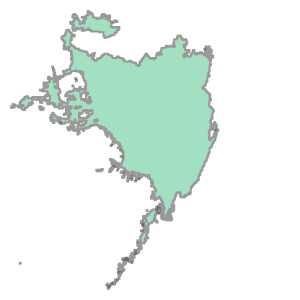

In [3]:
#get the projected buff file which gives us the polygon on ice cover. 
#now depending on march and september we have different files. Also, for march we will have the friction term too.
month='Sep'
typ='all_ice'
if month=='Sep':
    # prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer_proj.shp'
    # buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer.shp'
    prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/all_ice/Buffer_proj.shp'
    buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/all_ice/Buffer.shp'

else:
    buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/tc_mid/Buffer.shp'
    prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/tc_mid/Buffer_proj.shp'
    if typ=='all_ice':
    #all ice
        prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/all_ice/Buffer_proj.shp'
        buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/all_ice/Buffer.shp'
# reader=shapefile.Reader(buffile)
# multipol=shape(reader.shape())
multipol = fiona.open(buffile)
multipolprj=fiona.open(prjbuffile)
multi= multipol.next() # only one feature in the shapefile
multipol=shape(multi['geometry'])
multipol

In [49]:
#check if a point lies in sea ice polygon. If so, give the point a param id of 1 and else a param id of 100.  
paramid=[]
inProj = Proj(init='epsg:4326', preserve_units=True)
outProj = Proj(init='epsg:6931')
for i in range(len(finemodoceanlatpointvec)):
    x2,y2 = transform(inProj,outProj,finemodoceanlonpointvec[i],finemodoceanlatpointvec[i])
    point=shape(Point(x2,y2))
    # print(point)
    if point.within(multipol.buffer(0)):
        paramid=np.append(paramid,1)

        # inicelon=np.append(inicelon,finemodoceanlonpointvec[i])
        # inicelat=np.append(inicelat,finemodoceanlatpointvec[i])
        # count+=1
    else:
        paramid=np.append(paramid,100)


/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferre

In [6]:
fname='icepolygonpoints_Sep.xyz'
headerlist=['Lon','Lat','pid']
df=pd.read_csv(fname,names=headerlist,delim_whitespace=True)
df.head()
icepollonpointvec=np.array(df['Lon'])
icepollatpointvec=np.array(df['Lat'])
icepid=np.array(df['pid'])

In [7]:
#now based on paramid, we  get the index of all the inpolygon points.

inicepolindex=np.where(icepid==1.)[0]

#let us plot the points and polygon to see if we have it all correct.

NameError: name 'finemodoceanlonpointvec' is not defined

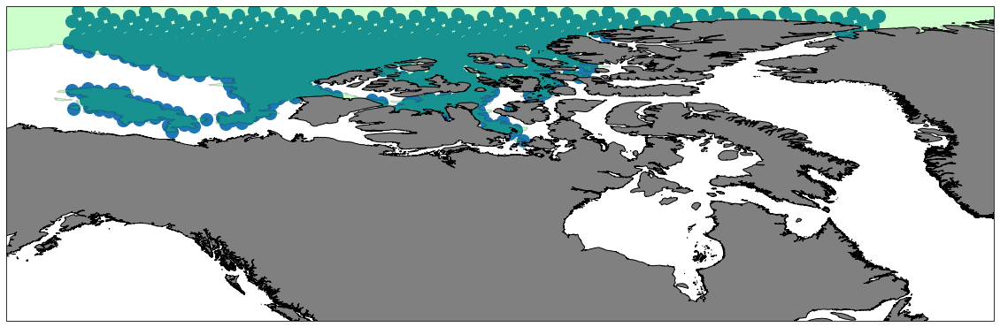

In [8]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
ax1.scatter(icepollonpointvec[inicepolindex],icepollatpointvec[inicepolindex],transform=ccrs.PlateCarree(),s=200)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
ax1.scatter(finemodoceanlonpointvec,finemodoceanlatpointvec,transform=ccrs.PlateCarree(),s=3)
# fig.savefig('vis_poly_marchv2.jpg',dpi=1000)


In [ ]:
#since the above in polygon check takes a lot of time. we just save the generated file so as to not have  to run it again and again.
# vec=np.vstack((oceanpointlonvec,oceanpointlatvec))
vec=np.vstack((finemodoceanlonpointvec,finemodoceanlatpointvec))
# paraidvec=1*(np.ones(len(oceanpointlonvec))).astype(int)
vec=np.vstack((vec,paramid.reshape((1,len(paramid)))))
np.savetxt('icepolygonpoints_march_13.xyz',vec.T,fmt=['%0.5f','%0.5f','%d'],delimiter='\t')

The next few steps focus on computing the viscosity based on sea ice thickenss and concentration.

Getting the ice thickness and ice concentration from CMEMS global ocean reanlaysis product. 
https://resources.marine.copernicus.eu/product-detail/GLOBAL_MULTIYEAR_PHY_001_030/INFORMATION

But above product was only till july 2020. so we used:

https://resources.marine.copernicus.eu/product-detail/ARCTIC_MULTIYEAR_PHY_002_003/INFORMATION

but turns out this is in polar stereographic north coordinates. :)


In [ ]:
if month=='Sep':
#sept
    sitfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650276570205.nc'
#march
else:
    sitfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650373925748.nc'
sitdata=xr.open_dataset(sitfile)
sitdata

<xarray.Dataset>
Dimensions:        (time: 1, x: 609, y: 845)
Coordinates:
    latitude       (y, x) float32 ...
  * x              (x) float32 -38.0 -37.88 -37.75 -37.62 ... 37.75 37.88 38.0
  * y              (y) float32 -52.75 -52.62 -52.5 -52.38 ... 52.5 52.62 52.75
  * time           (time) datetime64[ns] 2020-03-15
    longitude      (y, x) float32 ...
Data variables:
    stereographic  int32 ...
    sithick        (time, y, x) float32 ...
Attributes:
    institution:                     NERSC, Thormoehlens gate 47, N-5006 Berg...
    history:                         20211013:Created by program hyc2proj, ve...
    source:                          NERSC-HYCOM model fields
    references:                      http://topaz.nersc.no
    FROM_ORIGINAL_FILE__field_type:  Files based on file type nersc_weekly
    Conventions:                     CF-1.4
    title:                           Arctic Ocean Physics Reanalysis, 12.5km ...
    field_date:                      2020-12-15
    version:                         v4b
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention
    comment:

In [12]:
sitlon=np.array(sitdata.longitude.values).ravel()
sitlat=np.array(sitdata.latitude.values).ravel()
sit=sitdata.sithick.values[0,:,:]
sit=sit.ravel()
sit=np.where((np.isnan(sit)==True),0,sit)
#may be smart to convert nan to 0?
# print(sit)

In [13]:
#interpolate the sit data to the points within the ice cover from NSIDC. 
#inicelon and inicelat are the vectors.
from scipy.interpolate import NearestNDInterpolator 
# #nearest interpolator is used because of a lot of nan values around. and interpolation really makes it smooth. which we don't want. 
interpfunc=NearestNDInterpolator(list(zip(sitlon,sitlat)),sit)
siti=interpfunc(finemodoceanlonpointvec[inicepolindex],finemodoceanlatpointvec[inicepolindex])
# siti=siti[:,0]
#above is for a 2D grid.

Now we read sea ice concentration data.

In [14]:
#sept
if month=='Sep':
    sicfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650276490073.nc'
#march
else:
    sicfile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/CMEMS/cmems_mod_arc_phy_my_topaz4_P1M_1650373962695.nc'
sicdata=xr.open_dataset(sicfile)
sicdata

<xarray.Dataset>
Dimensions:        (time: 1, x: 609, y: 845)
Coordinates:
    latitude       (y, x) float32 ...
  * x              (x) float32 -38.0 -37.88 -37.75 -37.62 ... 37.75 37.88 38.0
  * y              (y) float32 -52.75 -52.62 -52.5 -52.38 ... 52.5 52.62 52.75
  * time           (time) datetime64[ns] 2020-03-15
    longitude      (y, x) float32 ...
Data variables:
    stereographic  int32 ...
    siconc         (time, y, x) float32 ...
Attributes:
    institution:                     NERSC, Thormoehlens gate 47, N-5006 Berg...
    history:                         20211013:Created by program hyc2proj, ve...
    source:                          NERSC-HYCOM model fields
    references:                      http://topaz.nersc.no
    FROM_ORIGINAL_FILE__field_type:  Files based on file type nersc_weekly
    Conventions:                     CF-1.4
    title:                           Arctic Ocean Physics Reanalysis, 12.5km ...
    field_date:                      2020-12-15
    version:                         v4b
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention
    comment:

In [15]:
siclon=np.array(sicdata.longitude.values).ravel()
siclat=np.array(sicdata.latitude.values).ravel()
sic=sicdata.siconc.values[0,:,:]
sic=np.array(sic).ravel()
sic=np.where((np.isnan(sic)==True),0,sic)
#may be smart to convert nan to 0?
# print(sic)
interpfunc=NearestNDInterpolator(list(zip(siclon,siclat)),sic)
sici=interpfunc(finemodoceanlonpointvec[inicepolindex],finemodoceanlatpointvec[inicepolindex])
#1d vec


Now using the sic and sit values at these point we compute the viscosity eta. And then divide that by H (bathymetry)

In [16]:
#shear and bulk viscosities of sea ice EVP and shiming yu ppt
#standard values.
def computeiceviscosity(sic,sit):
    P_s=25e03
    #deltao=2e-09
    #but turns out for central arctic a value of e-07 is oberves
    #references like kwok et al 2003 and luneva saw 10-7 to 10^-6
    #deltao must be much smaller than typical strain rate values. 3But deltao =1e-05 is for liear law
    deltao=1e-05
    e=2.
    rhoi=920.
    C=20.
    #Start by computing P
    #P=P_s*h*np.exp(-C(1-A))
    Pvec=[]
    for i in range(len(sit)):
        h=sit[i]
        A=sic[i]
        if (A>0.0) and (h>0.0):
            print(A,h)   #only using ice  concentration A>0.0 and h>0.0.
            P=P_s*h*np.exp(-C*(1-A))
            Pvec=np.append(Pvec,P)
        else:
            Pvec=np.append(Pvec,0)
    etaivec=Pvec/(2*deltao*e**2)
    etaivec=etaivec/rhoi
    return(etaivec)

etaivec=computeiceviscosity(sici,siti)

0.77496725 0.18016613
0.5804064 0.15279691
0.9544453 0.34045812
0.7452445 0.20173627
0.6302887 0.17461191
0.9760109 1.0526098
0.70928794 0.18466632
0.76929444 0.18975152
0.97857195 0.9471947
0.981424 1.1488115
0.7996048 0.22871667
0.98546594 0.9433627
0.7693024 0.2433091
0.98370904 1.310056
0.64429 0.16365248
0.9836366 0.88542324
0.63464826 0.2535987
0.9886366 1.0956812
0.8071134 0.2265368
0.9590013 1.1954266
0.8028058 0.29999068
0.34969386 0.059393495
0.9647135 1.009972
0.9905805 1.0421828
0.91816926 0.25217706
0.9859718 0.9838785
0.8647441 0.24831587
0.99387896 1.0134068
0.9021726 0.25012574
0.9817057 0.8839692
0.7525324 0.32091603
0.97609884 1.0618834
0.71731216 0.1561987
0.9940663 0.8055849
0.7393336 0.19258645
0.10472538 0.033352748
0.7826566 0.36750692
0.9931975 1.0110024
0.9916665 0.95186365
0.30840236 0.071599364
0.9882238 1.0954089
0.8718008 0.35594842
0.99275154 0.9767404
0.7444902 0.32315725
0.9922608 1.0152148
0.98870283 1.1364456
0.34793675 0.09281727
0.9531814 1.5787662
0

In [39]:
siti.min()

0.0

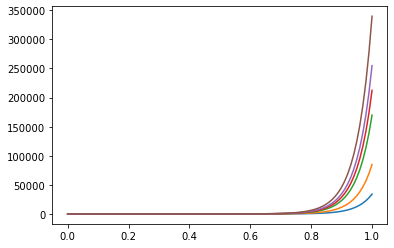

In [43]:
#trying to plot the viscosity for varying ice concentraion to get an idea.
A=np.linspace(0,1,101)
hvec=[0.2,0.5,1,1.25,1.5,2.0]
for i in hvec:
    visvec=(25e03*i/(2*2e-05*4))*np.exp(-20*(1-A))
    plt.plot(A,visvec/920)

Now we divide this by bathymetry to get the depth averaged form. The bathymetry from canada model is obtained and interpolated to the ice poiints.

In [17]:
netcanda='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/snelliusmodels/basic_test_model/stochModel/input_model/gtsm__canada_2_net.nc'
netdata=xr.open_dataset(netcanda)
netdata

<xarray.Dataset>
Dimensions:      (nNetLink: 560343, nNetLinkPts: 2, nNetNode: 278376)
Coordinates:
    NetNode_x    (nNetNode) float64 ...
    NetNode_y    (nNetNode) float64 ...
Dimensions without coordinates: nNetLink, nNetLinkPts, nNetNode
Data variables:
    Mesh2D       int32 ...
    wgs84        int32 ...
    NetNode_z    (nNetNode) float64 ...
    NetLink      (nNetLink, nNetLinkPts) int32 ...
    NetLinkType  (nNetLink) int32 ...
Attributes:
    institution:    Deltares
    references:     http://www.deltares.nl
    source:         Deltares, D-Flow FM Version 1.2.59.64338M, Jul 19 2019, 1...
    history:        Created on 2021-07-21T17:40:42+0200, D-Flow FM
    date_created:   2021-07-21T17:40:42+0200
    date_modified:  2021-07-21T17:40:42+0200
    Conventions:    UGRID-0.9

In [18]:
netx=netdata.NetNode_x.values
nety=netdata.NetNode_y.values
Hbathy=netdata.NetNode_z.values
#may be better if nan values to put it to zero.
Hbathy=np.where((np.isnan(Hbathy)==True),0,Hbathy)
#we use a linear interpolator now because it is more accurate and less chances of point being on land. 
from scipy.interpolate import griddata
# interpfunc=griddata(list(zip(netx,nety)),Hbathy,list(zip(netx,nety)))
Hvec=griddata(list(zip(netx,nety)),Hbathy,list(zip(finemodoceanlonpointvec[inicepolindex],finemodoceanlatpointvec[inicepolindex])),method='cubic')
#nan values occur for points outside the grid. so at these points we use nearest nd interpolator.
interpfunc=NearestNDInterpolator(list(zip(netx,nety)),Hbathy,list(zip(netx,nety)))
Hvecnearest=interpfunc(finemodoceanlonpointvec[inicepolindex],finemodoceanlatpointvec[inicepolindex])
Hvecf=np.where(np.isnan(Hvec)==True,Hvecnearest,Hvec)
#where Hvecf is positive we set it as -e^16.
posindex=np.where(Hvecf>0.0)
Hvecf=np.where(Hvecf>0.0,-1e16,Hvecf)
#important this is the fill value type.


In [19]:
etai_daveraged=-etaivec/Hvecf

In [29]:
#now we make the viscosity as etai_daveraged at all points outside the ice polygon to zero.
etaall=np.zeros(len(paramid))
etaall[inicepolindex]=etai_daveraged
#sic and sit for all points
sicall=np.zeros(len(paramid))
sicall[inicepolindex]=sici
sitall=np.zeros(len(paramid))
sitall[inicepolindex]=siti

In [23]:
#save the viscosity value file.
fname='viscosityval_20200313_v4.xyz'
vec=np.vstack((finemodoceanlonpointvec,finemodoceanlatpointvec))
vec=np.vstack((vec,etaall.reshape((1,len(etaall)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec[2,:]=1.0 #starting with 1.0 as the multiplier.
np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

In [24]:
#open viscosity file and plot the viscosity value.
fname='viscosityval_20200313_v3.xyz'
headerlist=['Lon','Lat','pname']
df=pd.read_csv(fname,names=headerlist,delim_whitespace=True)
df.head()
vislonpointvec=np.array(df['Lon'])
vislatpointvec=np.array(df['Lat'])
visvalue=np.array(df['pname'])


check if the viscosity values are correctly set to points in polygon.

In [27]:
print(etaall.max())
visvalue.max()

53108.364913076584


53108.365

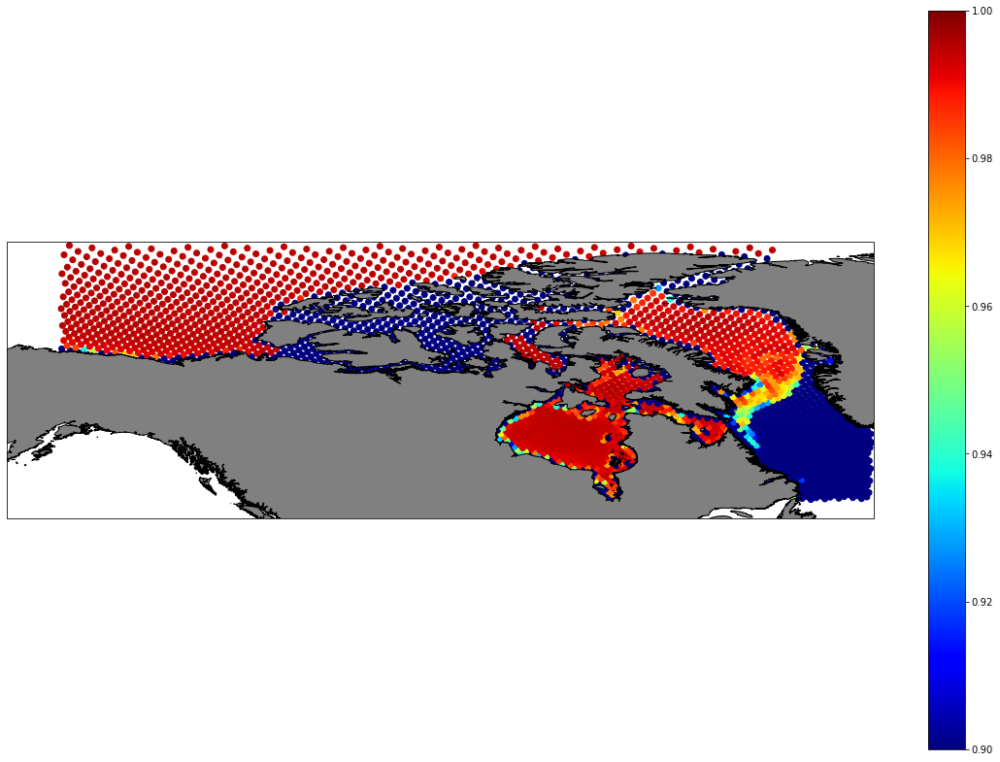

In [40]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
cont=ax1.scatter(finemodoceanlonpointvec,finemodoceanlatpointvec,c=sicall,transform=ccrs.PlateCarree(),vmin=0.9,vmax=1.0,cmap='jet')
# ax1.legend()
plt.colorbar(cont)
# shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
# ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
plt.savefig('sicvalue_20200315.jpg',dpi=300)

Once we have this file. We create a parameter files for sea ice. We use the same squares we had before. but that makes it complex. so we decide to use qgis again and create polygons there.

In [3]:
fname='modelpoints_fb.xyz'
headerlist=['Lon','Lat','pname']
df=pd.read_csv(fname,names=headerlist,delim_whitespace=True)
df.head()
modoceanlonpointvec=np.array(df['Lon'])
modoceanlatpointvec=np.array(df['Lat'])

In [6]:
if month=='Sep':
#sept
    poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/ice_vis_polygon_20200917/ice_poly_v2.csv')
#mar
else:
    poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/ice_vis_polygon_20200313/ice_poly_v1.csv')

poldf.head()
poldf.id.values

array([1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 4,
       4, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5])

In [7]:
Npol=6
# Npol=13
Lonvec=poldf['X']
Latvec=np.array(poldf['Y'])
# Latvec[78]=72.0  ##it was 72.0033 changed as it is wrong in excel file
# Latvec=np.where(Latvec==84,84.5,Latvec) ##points added till 84.3
# Lonvec=np.where(Lonvec==-46.5,-46.0,Lonvec)
idvec=poldf['id']
vindexvec=poldf['vertex_index']
polydict={}
for id in range(Npol):
    id=id+1 #as the ids start from 1
    idindex=np.where(idvec==id)[0]
    coords=[]
    for i in range(len(idindex)):
        coords.append((Lonvec[idindex[i]],Latvec[idindex[i]]))
    poly=Polygon(coords)
    polydict[id]=poly

In [8]:
#check if a point lies in a polygon and in sea ice.. If so, assign the point a value of parameter corresponding to polygon id and the other points a parameter
# id corresponding to 100.
paramid=[]
paramid=[]
inProj = Proj(init='epsg:4326', preserve_units=True)
outProj = Proj(init='epsg:6931')
# for i in range(len(finemodoceanlatpointvec)):
#     x2,y2 = transform(inProj,outProj,finemodoceanlonpointvec[i],finemodoceanlatpointvec[i])
#     point=shape(Point(x2,y2))
#     # print(point)
#     if point.within(multipol.buffer(0)):
#         paramid=np.append(paramid,1)
for i in range(len(modoceanlonpointvec)):
    point=Point(modoceanlonpointvec[i],modoceanlatpointvec[i])
    x2,y2 = transform(inProj,outProj,modoceanlonpointvec[i],modoceanlatpointvec[i])
    pointNP=shape(Point(x2,y2))
    count=0
    for keys in polydict:
        poly=polydict[keys]
        if poly.contains(point) and pointNP.within(multipol.buffer(0)):
            paramid=np.append(paramid,keys)
            count=1
    if count==0:
        paramid=np.append(paramid,100)
        print('Point not contained in any polyon')
        print(point)

/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferre

Point not contained in any polyon
POINT (-80.35835 50.24973)
Point not contained in any polyon
POINT (-78.54935 50.631)
Point not contained in any polyon
POINT (-81.47638000000001 50.86816)
Point not contained in any polyon
POINT (-79.66737999999999 51.25452)
Point not contained in any polyon
POINT (-47.2062 51.27632)
Point not contained in any polyon
POINT (-54.86924 51.368)
Point not contained in any polyon
POINT (-82.59439999999999 51.4949)
Point not contained in any polyon
POINT (-50.13322 51.51682)
Point not contained in any polyon
POINT (-77.85838 51.64415)
Point not contained in any polyon
POINT (-53.06024 51.7586)
Point not contained in any polyon
POINT (-80.7854 51.88661)
Point not contained in any polyon
POINT (-48.32422 51.90872)
Point not contained in any polyon
POINT (-55.98726 52.00168)
Point not contained in any polyon
POINT (-83.71241999999999 52.13039)
Point not contained in any polyon
POINT (-51.25124 52.15262)
Point not contained in any polyon
POINT (-78.9764 52.2817

In [10]:
fname='viscosity_correction_sept_template_'+str(Npol)+'_v3.xyz'
sortind=np.argsort(paramid) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((modoceanlonpointvec[sortind],modoceanlatpointvec[sortind]))
vec=np.vstack((vec,paramid[sortind].reshape((1,len(paramid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
#no inpolindex required here.
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%d'],delimiter='\t')


[[-144.12418 -138.96111 -149.97823 ...  -83.34768  -92.81972 -101.33686]
 [  73.86224   70.7803    74.97972 ...   63.4446    63.03258   68.15108]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-144.12418 -138.96111 -149.97823 ...  -83.34768  -92.81972 -101.33686]
 [  73.86224   70.7803    74.97972 ...   63.4446    63.03258   68.15108]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-144.12418 -138.96111 -149.97823 ...  -83.34768  -92.81972 -101.33686]
 [  73.86224   70.7803    74.97972 ...   63.4446    63.03258   68.15108]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-144.12418 -138.96111 -149.97823 ...  -83.34768  -92.81972 -101.33686]
 [  73.86224   70.7803    74.97972 ...   63.4446    63.03258   68.15108]
 [   1.         1.         1.      ...  100.       100.       100.     ]]
[[-144.12418 -138.96111 -149.97823 ...  -83.34768  -92.81972 -101.33686]
 [  73.86224   70.7803    74.97972 ...   63.444

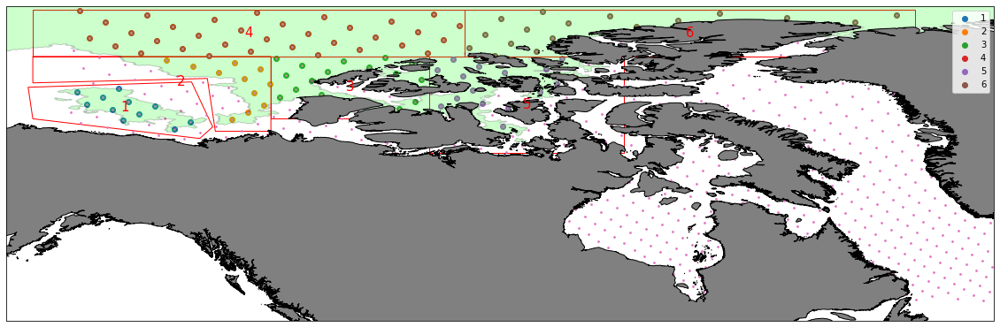

In [11]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
# ax1.set_extent((-60, -55, 49, 84), crs=ccrs.PlateCarree())
for keys in polydict:
    ax1.add_geometries([polydict[keys]],crs=ccrs.PlateCarree(),edgecolor='red',facecolor='None',label=keys)
    x=polydict[keys].centroid.x
    y=polydict[keys].centroid.y
    ax1.text(x, y, keys, color='red', size=15, ha='center', va='center', transform=ccrs.PlateCarree())
    #getting points in polygon. from paramid.
    indparam=np.where(vec[2,:]==keys)[0]
    print(vec)
    ax1.scatter(vec[0,indparam],vec[1,indparam],transform=ccrs.PlateCarree(),label=str(keys))

ax1.legend()
ax1.scatter(modoceanlonpointvec,modoceanlatpointvec,transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
ax1.add_feature(feature)
fig.savefig('vis_poly_para_sept3.jpg',dpi=1000)
# plt.show()

In [12]:
fname='viscosity_correction_sep_'+str(Npol)+'_v3.xyz'
sortind=np.argsort(paramid) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((modoceanlonpointvec[sortind],modoceanlatpointvec[sortind]))
vec=np.vstack((vec,paramid[sortind].reshape((1,len(paramid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
vec[2,:]=1.0 #starting with 1.0 as the multiplier.

np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

Now we try to do similar things with fast ice cover. First step is plotting fast ice and getting the points within fast ice


In [5]:
#get the projected buff file which gives us the polygon on ice cover. 
#now depending on march and september we have different files. Also, for march we will have the friction term too.
month='march'
# prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer_proj.shp'
# buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200917/tc_mid/Buffer.shp'
buffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/fast/Buffer.shp'
prjbuffile='/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/nh_20200313/fast/Buffer_proj.shp'
# reader=shapefile.Reader(buffile)
# multipol=shape(reader.shape())
multipol = fiona.open(buffile)
multipolprj=fiona.open(prjbuffile)
multi= multipol.next() # only one feature in the shapefile
multipol=shape(multi['geometry'])
multipol

/tmp/ipykernel_12126/2842779930.py:12: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  multi= multipol.next() # only one feature in the shapefile


In [6]:
#check if a point lies in sea ice polygon. If so, give the point a param id of 1 and else a param id of 100.  
paramid=[]
inProj = Proj(init='epsg:4326', preserve_units=True)
outProj = Proj(init='epsg:6931')
for i in range(len(finemodoceanlatpointvec)):
    x2,y2 = transform(inProj,outProj,finemodoceanlonpointvec[i],finemodoceanlatpointvec[i])
    point=shape(Point(x2,y2))
    # print(point)
    if point.within(multipol.buffer(0)):
        paramid=np.append(paramid,1)

        # inicelon=np.append(inicelon,finemodoceanlonpointvec[i])
        # inicelat=np.append(inicelat,finemodoceanlatpointvec[i])
        # count+=1
    else:
        paramid=np.append(paramid,100)

/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferre

In [7]:
inficepolindex=np.where(paramid==1.)[0]

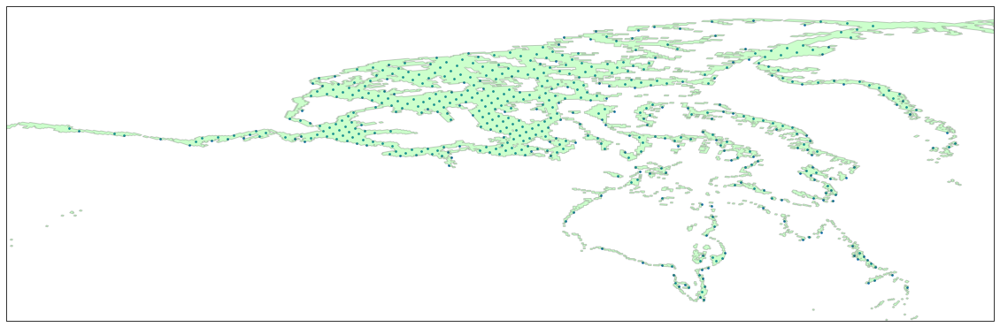

In [8]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
ax1.scatter(finemodoceanlonpointvec[inficepolindex],finemodoceanlatpointvec[inficepolindex],transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
# feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
# ax1.add_feature(feature)
fig.savefig('fice_poly_marchv1.jpg',dpi=1000)

Now we divide the fast ice region into different polygons.

In [9]:
poldf=pd.read_csv('/u/vasulkar/p_emodnet_amey/Regional_canada_model/model_development/Openda_models/Icedata/fastice_polygon_20200313/fice_polygon_v1.csv')

poldf.head()
poldf.id.values

array([16, 16, 16, 16, 16,  1,  1,  1,  1,  1,  3,  3,  3,  3,  3,  4,  4,
        4,  4,  4,  8,  8,  8,  8,  8,  6,  6,  6,  6,  6,  2,  2,  2,  2,
        2,  5,  5,  5,  5,  5,  5,  5,  7,  7,  7,  7,  7,  7,  7, 14, 14,
       14, 14, 14, 11, 11, 11, 11, 11, 20, 20, 20, 20, 20, 20,  9,  9,  9,
        9,  9, 15, 15, 15, 15, 15, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18,
       19, 19, 19, 19, 19, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 10, 10,
       10, 10, 10])

In [10]:
Npol=20
# Npol=13
Lonvec=poldf['X']
Latvec=np.array(poldf['Y'])
# Latvec[78]=72.0  ##it was 72.0033 changed as it is wrong in excel file
# Latvec=np.where(Latvec==84,84.5,Latvec) ##points added till 84.3
# Lonvec=np.where(Lonvec==-46.5,-46.0,Lonvec)
idvec=poldf['id']
vindexvec=poldf['vertex_index']
polydict={}
for id in range(Npol):
    id=id+1 #as the ids start from 1
    idindex=np.where(idvec==id)[0]
    coords=[]
    for i in range(len(idindex)):
        coords.append((Lonvec[idindex[i]],Latvec[idindex[i]]))
    poly=Polygon(coords)
    polydict[id]=poly

In [12]:
#check if a point lies in a polygon and in fast ice.  If so, assign the point a value of parameter corresponding to polygon id and the other points a parameter
# id corresponding to 100.
#inficepolindex gives points in fice.
paramid=[]
paramid=[]
inProj = Proj(init='epsg:4326', preserve_units=True)
outProj = Proj(init='epsg:6931')
# for i in range(len(finemodoceanlatpointvec)):
#     x2,y2 = transform(inProj,outProj,finemodoceanlonpointvec[i],finemodoceanlatpointvec[i])
#     point=shape(Point(x2,y2))
#     # print(point)
#     if point.within(multipol.buffer(0)):
#         paramid=np.append(paramid,1)
for i in range(len(finemodoceanlonpointvec)):
    point=Point(finemodoceanlonpointvec[i],finemodoceanlatpointvec[i])
    # x2,y2 = transform(inProj,outProj,modoceanlonpointvec[i],modoceanlatpointvec[i])
    # pointNP=shape(Point(x2,y2))
    count=0
    if finemodoceanlonpointvec[i] in finemodoceanlonpointvec[inficepolindex] and finemodoceanlatpointvec[i] in finemodoceanlatpointvec[inficepolindex]:
        for keys in polydict:
            poly=polydict[keys]
            if poly.contains(point) : #and pointNP.within(multipol.buffer(0))
                paramid=np.append(paramid,keys)
                count=1 
            else:
                print('Point not in polygon.')
    if count==0:
        paramid=np.append(paramid,100)
        # print('Point not contained in any polyon')
        print(point)

/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/u/vasulkar/.conda/envs/plotting/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferre

POINT (-79.45452 50.25218)
POINT (-80.57254 50.38139)
POINT (-78.76354000000001 50.46142)
POINT (-79.88155999999999 50.59121)
POINT (-80.99959 50.72135)
POINT (-79.19059 50.80196)
POINT (-80.30861 50.93269)
POINT (-78.49961 51.01367)
POINT (-81.42663 51.06379)
POINT (-79.61763000000001 51.145)
POINT (-80.73566 51.2767)
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
Point not in polygon.
POINT (-54.12852 51.38215)
POINT (-81.85368 51.40878)
POINT (-52.31952 51.46393)
POINT (-80.04468 51.49061)
POINT (-47.5835 51.49521)
POINT (-55.24654 51.51454)
POINT (-50.51052 51.54585)
POINT (-78.23568 51.57258)
POINT (-53.43755 51.59655)
POINT (-81.1627 51.

In [14]:
fname='fastice_correction_march_template_'+str(Npol)+'_v1.xyz'
sortind=np.argsort(paramid) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((finemodoceanlonpointvec[sortind],finemodoceanlatpointvec[sortind]))
vec=np.vstack((vec,paramid[sortind].reshape((1,len(paramid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
#no inpolindex required here.
# inpolindex=np.where(paravec!=100) [0]
# vec=vec[:,inpolindex]
np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%d'],delimiter='\t')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


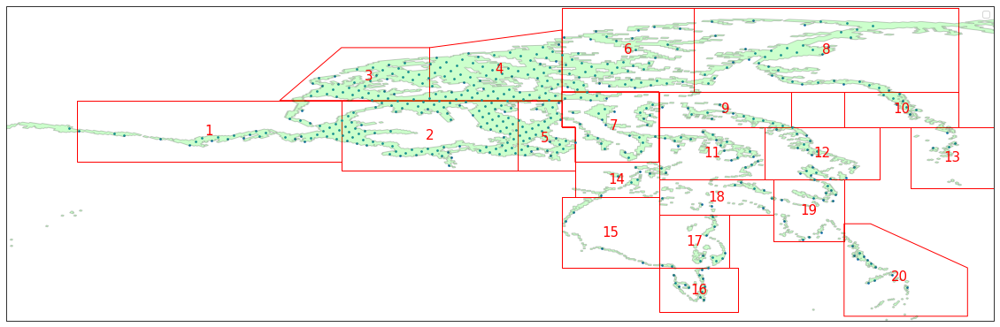

In [19]:
fig=plt.figure(figsize=(20, 14), frameon=True)
# proj=ccrs.NorthPolarStereo(central_longitude=0.0,true_scale_latitude=None, globe=None)
proj=ccrs.PlateCarree()
ax1=fig.add_subplot(1,1,1,projection=proj) 
ax1.set_extent((-158, -46, 49, 84.7), crs=ccrs.PlateCarree())
# ax1.set_extent((-60, -55, 49, 84), crs=ccrs.PlateCarree())
for keys in polydict:
    ax1.add_geometries([polydict[keys]],crs=ccrs.PlateCarree(),edgecolor='red',facecolor='None',label=keys)
    x=polydict[keys].centroid.x
    y=polydict[keys].centroid.y
    ax1.text(x, y, keys, color='red', size=15, ha='center', va='center', transform=ccrs.PlateCarree())
    #getting points in polygon. from paramid.
    indparam=np.where(vec[2,:]==keys)[0]
    # print(vec)
    # ax1.scatter(vec[0,indparam],vec[1,indparam],transform=ccrs.PlateCarree(),label=str(keys))

ax1.legend()
ax1.scatter(finemodoceanlonpointvec[inficepolindex],finemodoceanlatpointvec[inficepolindex],transform=ccrs.PlateCarree(),s=3)
# ax1.legend()
shape_feature = ShapelyFeature(multipol.buffer(0), ccrs.LambertAzimuthalEqualArea(central_latitude=90.0), facecolor="lime", edgecolor='black',alpha=0.2)
ax1.add_feature(shape_feature)
# feature=cpf.GSHHSFeature(scale='i',levels=[1],facecolor='grey',alpha=1)
# ax1.add_feature(feature)
fig.savefig('fice_poly_para_marchv2.jpg',dpi=1000)
# plt.show()

In [20]:
fname='fastice_correction_march_'+str(Npol)+'_v1.xyz'
sortind=np.argsort(paramid) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((finemodoceanlonpointvec[sortind],finemodoceanlatpointvec[sortind]))
vec=np.vstack((vec,paramid[sortind].reshape((1,len(paramid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# paravec=vec[2,:]
inpolindex=np.where(paravec!=100) [0] #set value only points insice fice,
vec[2,:]=0.0 # 0 for points outside the fice. 
vec[2,inpolindex]=1.0 #starting with 1.0 as the multiplier.

np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

In [22]:
fname='fastice_initial_frictionvalue_march.xyz' # viscosityval_20200917_v2.xyz
sortind=np.argsort(paramid) #sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((finemodoceanlonpointvec[sortind],finemodoceanlatpointvec[sortind]))
vec=np.vstack((vec,paramid[sortind].reshape((1,len(paramid)))))
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
# vec=vec[:,:-2]#removing the last point. as it is outside . point 100.
paravec=vec[2,:]
inpolindex=np.where(paravec!=100) [0] #set value only points insice fice,
# vec=vec[:,inpolindex]
vec[2,:]=0.0 # 0 for points outside the fice. 
vec[2,inpolindex]=42.2 #starting with 1.0 as the multiplier.

np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

modifying the value of the correction in non fast ice polygon. it was 1.0 we make it 0.0. Just to be safe!

In [10]:
headerlist=["Lon","Lat","Value"]
df=pd.read_csv('fastice_correction_march_template_20_v1.xyz',delim_whitespace=True,names=headerlist)   
posvec=np.vstack((df['Lon'],df['Lat'])).T
paramid=np.array(df['Value'])
fname='fastice_correction_march_20_v2.xyz'#sorting based on paramid value.
#converting to a .xyz file
vec=np.vstack((posvec[:,0],posvec[:,1]))
vec=np.vstack((vec,paramid.reshape((1,len(paramid)))))
inpolindex=np.where(paramid!=100) [0] #set value only points insice fice,
# vec=vec[:,inpolindex]
vec[2,:]=0.0 # 0 for points outside the fice. 
vec[2,inpolindex]=1.0 #starting with 1.0 as the multiplier.

np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

Now we try to develop a python script which reads in all the fast ice and bottom friction coefficient values and tries to evaluate and effective on.


In [3]:
#package required pandas.
#reading a .xyz file.
def readxyzfile(file):
    headerlist=["Lon","Lat","Value"]
    df=pd.read_csv(file,delim_whitespace=True,names=headerlist)   
    posvec=np.vstack((df['Lon'],df['Lat'])).T
    valvec=np.array(df['Value'])
    return(posvec,valvec)

#in the below function, we 
def gettgindex(tgid,tgidvec,regional_tg_pos,tstaposdata):
    #library needed. scipy.spatial.distance --> cdist
    #first step is to find the lon lat corresponding to tgid from the regional_tg_pos data.
    #then compare these lon lat with tstaposdata and where matching take those indices.
    indreg=np.where(tgidvec==int(tgid))[0]
    itgvec=np.vstack((regional_tg_pos[indreg,0],regional_tg_pos[indreg,1])).T
    #with spatial
    distmat=sdist.cdist(tstaposdata,itgvec)
    tgregindx=np.where(distmat==0)[0]
    #Think about this approach later.
    # #now find where in our normal tstanamdata are these and compute the graphs and stats.
    # longregindex=np.isin(tstaposdata[:,0],itglon)
    # latgregindex=np.isin(tstaposdata[:,1],itglat)
    # tgregindex=longregindex and latgregindex
    # trialtg=tstaposdata[:,0][tgregindex]
    return(tgregindx)

The idea is that we compute a net chezy based on fast ice and bf coefficient. 
$$C_{net}=C_b+C_f,$$
Now, $C_b=\frac{g}{Ch_b^2}$ and $C_f=\frac{g}{Ch_f^2}.$ Let the calibration constants be, $Kb$ and $Kf$ and the net chezy be $Ch_{net}$. 
Then, we have,
$$\frac{g}{Ch_{net}^2}=\frac{g}{(KbCh_b)^2}+\frac{g}{(KfCh_f)^2},$$
$$\Rightarrow Ch_{net}=\sqrt{\frac{1}{\frac{1}{(KbCh_b)^2}+\frac{1}{(KfCh_f)^2}}}$$

This means for each point we compute the Ch_net and give that as input file to dflowfm.



In [6]:
#reading the 4 files which give us Kb, Chb, Kf, Chf.
bf_initial='bf_initial_16_v5.xyz'
bf_correction='bf_correction_16_v5.xyz'
fice_initial='fastice_initial_frictionvalue_march.xyz'
fice_correction='fastice_correction_march_20_v1.xyz'
(bf_initial_pos,bf_initial_val)=readxyzfile(bf_initial)
(bf_correction_pos,bf_correction_val)=readxyzfile(bf_correction)
(fice_initial_pos,fice_initial_val)=readxyzfile(fice_initial)
(fice_correction_pos,fice_correction_val)=readxyzfile(fice_correction)

In [29]:
Chnetvec=[]
testlonlatvec=np.zeros(np.shape(bf_initial_pos))
import scipy.spatial.distance as sdist
for i in range(len(bf_correction_val)):
    (loni,lati)=(bf_initial_pos[i,0],bf_initial_pos[i,1])
    #get index of this lon lat in fice.
    distmat=sdist.cdist(fice_initial_pos,np.array([[loni,lati]]))
    lonlatindex=np.where(distmat==0)[0]
    # lonlatindex=np.where((fice_initial_pos[:,0]==loni and fice_initial_pos[:,1]==lati ))
    
    #bf evaluation
    bfeval=bf_correction_val[i]*bf_initial_val[i]
    #fice evaluation
    ficeeval=fice_correction_val[lonlatindex]*fice_initial_val[lonlatindex]
    #testlonlat
    testlonlatvec[i,:]=fice_initial_pos[lonlatindex,:]
    #net eval
    if ficeeval==0:
        neteval=(1/(bfeval**2))
    else:
        neteval=(1/(bfeval**2))+(1/(ficeeval**2))
    #Chnet
    Chneti=np.sqrt(1/neteval)
    Chnetvec=np.append(Chnetvec,Chneti)

In [32]:
test=np.isin(fice_initial_pos,testlonlatvec)

In [33]:
np.where(test==False)

(array([], dtype=int64), array([], dtype=int64))

In [35]:
fname='Chezynet_march.xyz'
#converting to a .xyz file
vec=np.vstack((bf_initial_pos.T,Chnetvec.reshape((1,len(Chnetvec)))))
np.savetxt(fname,vec.T,fmt=['%0.2f','%0.2f','%0.3f'],delimiter='\t')

In [36]:
1/62.5**2+1/42.2**2

0.0008175327598212078

In [37]:
9.81/(34.974*34.974)


0.00802007437861126